In [1]:
import os
from glob import glob
import numpy as np
import dask
import xarray as xr
import cartopy.crs as ccrs
from cmocean import cm
import xgcm

from matplotlib import pyplot as plt
%matplotlib inline
plt.rcParams['figure.figsize'] = 20, 12

from mitequinox.utils import *
from dask import compute, delayed

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/cmocean/tools.py:76: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not mpl.cbook.is_string_like(rgbin[0]):
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/importlib/_bootstrap.py:219: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


In [2]:
from dask_jobqueue import PBSCluster
local_dir = os.getenv('TMPDIR')
cluster = PBSCluster(local_directory=local_dir)
#print(cluster.job_script())
w = cluster.start_workers(30)

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils.py:128: RuntimeWarning: Couldn't detect a suitable IP address for reaching '8.8.8.8', defaulting to '127.0.0.1': [Errno 101] Network is unreachable
  % (host, default, e), RuntimeWarning)


In [3]:
# get dask handles and check dask server status
from dask.distributed import Client
client = Client(cluster)

In [4]:
client

Client Scheduler: tcp://10.148.1.0:45186 Dashboard: http://10.148.1.0:8787/status,Cluster Workers: 54 Cores: 216 Memory: 2700.00 GB


# 1. Compute linear geo terms (i.e. Coriolis term and pressure gradient)

In [5]:
E_dir = '/home1/scratch/xyu/momentum/'

In [10]:
data_dir = '/home1/scratch/xyu/mit_zarr/'
face_all = 13

D = [xr.open_zarr(data_dir+'UV/SSU_rotation_f%02d.zarr'%(face)) for face in range(face_all)]
ds_SSU = xr.concat(D, dim='face')

D = [xr.open_zarr(data_dir+'UV/SSV_rotation_f%02d.zarr'%(face)) for face in range(face_all)]
ds_SSV = xr.concat(D, dim='face')

D = [xr.open_zarr(data_dir+'Eta_f%02d.zarr'%(face)) for face in range(face_all)]
ds_Eta = xr.concat(D, dim='face')

#grid = xr.open_zarr('/home1/scratch/xyu/mit_grid.zarr')
grid = xr.open_dataset('/home1/scratch/xyu/grid/mit_grid.nc', decode_coords=True)

In [11]:
%time ds = xr.merge([ds_Eta, ds_SSU, ds_SSV, grid])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))
print('\n data size (1 face): %.1f GB' %(ds['Eta'].nbytes / 1e9))

CPU times: user 8 ms, sys: 0 ns, total: 8 ms
Wall time: 5.21 ms
<xarray.Dataset>
Dimensions:       (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 1440)
Coordinates:
  * face          (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
    dtime         (time) datetime64[ns] 2011-11-15 2011-11-15T01:00:00 ...
  * i             (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * j             (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * time          (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
  * i_g           (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
  * j_g           (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 ...
    XC            (face, j, i) float32 ...
    YC            (face, j, i) float32 ...
    XG            (face, j_g, i_g) float32 ...
    YG            (face, j_g, i_g) float32 ...
    CS            (face, j, i) float32 ...
    SN            (face, j, i) float32 ...
    rA            (face, j, 

In [12]:
grid = xgcm.Grid(ds, periodic=['X', 'Y'])
grid

<xgcm.Grid>
Y Axis (periodic):
  * center   j (4320) --> left
  * left     j_g (4320) --> center
X Axis (periodic):
  * center   i (4320) --> left
  * left     i_g (4320) --> center

## 1.1 linear coriolis term

In [13]:
lat = ds['YG']
omega = 7.3/100000
f = 2*omega*np.sin(np.deg2rad(lat))
f_i = grid.interp(f,'X')
f_j = grid.interp(f,'Y')

In [14]:
for face in range(ds['face'].size):

    dxgSSV_j = grid.interp(ds.dxG.isel(face=face) * ds['SSV_rotation'].isel(face=face),'Y') 
    dxgSSV_ji = grid.interp(dxgSSV_j,'X')    # SSV at (i_g,j)
    Coriolis_u_linear = f_j.isel(face=face) * dxgSSV_ji /ds.dxC.isel(face=face)    #f*SSV
    Coriolis_u_linear = np.real(Coriolis_u_linear).rename('Coriolis_u_linear')
    Coriolis_u_linear = Coriolis_u_linear.chunk({'time': 1,'i_g':4320,'j':4320})
    Coriolis_u_linear.to_dataset().to_zarr(E_dir+'Coriolis_u_linear_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

Exception ignored in: <bound method GCDiagnosis._gc_callback of <distributed.utils_perf.GCDiagnosis object at 0x2aaaf28552e8>>
Traceback (most recent call last):
  File "/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils_perf.py", line 188, in _gc_callback
    self._fractional_timer.start_timing()
  File "/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/utils_perf.py", line 111, in start_timing
    assert self._cur_start is None
AssertionError: 


face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


In [12]:
for face in range(ds['face'].size):

    dygSSU_i = grid.interp(ds.dyG.isel(face=face) * ds['SSU_rotation'].isel(face=face),'X') 
    dxgSSU_ij = grid.interp(dygSSU_i,'Y')    # SSU at (i,j_g)
    Coriolis_v_linear = -f_i.isel(face=face) * dxgSSU_ij /ds.dyC.isel(face=face)    #-f*SSU
    Coriolis_v_linear = np.real(Coriolis_v_linear).rename('Coriolis_v_linear')
    Coriolis_v_linear = Coriolis_v_linear.chunk({'time': 1,'i':4320,'j_g':4320})
    Coriolis_v_linear.to_dataset().to_zarr(E_dir+'Coriolis_v_linear_f%02d.zarr'% (face), mode='w')
    print('face=%d - allready processed'%(face))

face=0 - allready processed
face=1 - allready processed
face=2 - allready processed
face=3 - allready processed
face=4 - allready processed
face=5 - allready processed
face=6 - allready processed
face=7 - allready processed
face=8 - allready processed
face=9 - allready processed
face=10 - allready processed
face=11 - allready processed
face=12 - allready processed


## 1.2 'linear' gradient of pressure

In [ ]:
for face in range(ds['face'].size):

    g = 9.81
    
    dB_dx_geo_raw = grid.diff(g*ds['Eta'].isel(face=face),'X')/ds.dxC.isel(face=face)     # d(Eta*g)/dx
    dB_dy_geo_raw = grid.diff(g*ds['Eta'].isel(face=face),'Y')/ds.dyC.isel(face=face)     # d(Eta*g)/dy
    
    # rotation
    dB_dx_geo_raw_ij = grid.interp(dB_dx_geo_raw,'X')
    dB_dy_geo_raw_ij = grid.interp(dB_dy_geo_raw,'Y')    

    dB_dx_geo_raw_rotation =  dB_dx_geo_raw_ij*ds.CS.isel(face=face) - dB_dy_geo_raw_ij*ds.SN.isel(face=face)
    dB_dy_geo_raw_rotation =  dB_dx_geo_raw_ij*ds.SN.isel(face=face) + dB_dy_geo_raw_ij*ds.CS.isel(face=face)

    dB_dx_geo = grid.interp(dB_dx_geo_raw_rotation,'X')
    dB_dy_geo = grid.interp(dB_dy_geo_raw_rotation,'Y')
        
    dB_dx_geo = np.real(dB_dx_geo).rename('dB_dx_geo')    
    dB_dx_geo = dB_dx_geo.chunk({'time': 1,'i_g':4320,'j':4320})
    dB_dx_geo.to_dataset().to_zarr(E_dir+'dB_dx_geo_f%02d.zarr'% (face), mode='w')
    
    dB_dy_geo = np.real(dB_dy_geo).rename('dB_dy_geo')    
    dB_dy_geo = dB_dy_geo.chunk({'time': 1,'i':4320,'j_g':4320})
    dB_dy_geo.to_dataset().to_zarr(E_dir+'dB_dy_geo_f%02d.zarr'% (face), mode='w')
    
    print('face=%d - allready processed'%(face))

# 2. Read geo_metric dataset

In [5]:
E_dir = '/home1/scratch/xyu/momentum/'

In [10]:
D = [xr.open_zarr(E_dir+'Coriolis_u_linear_f%02d.zarr'%(face)) for face in range(13)]
ds_Coriolis_u = xr.concat(D, dim='face')

D = [xr.open_zarr(E_dir+'dB_dx_geo_f%02d.zarr'%(face)) for face in range(13)]
ds_B_x = xr.concat(D, dim='face')

D = [xr.open_zarr(E_dir+'Coriolis_v_linear_f%02d.zarr'%(face)) for face in range(13)]
ds_Coriolis_v = xr.concat(D, dim='face')

D = [xr.open_zarr(E_dir+'dB_dy_geo_f%02d.zarr'%(face)) for face in range(13)]
ds_B_y = xr.concat(D, dim='face')

%time ds = xr.merge([ds_Coriolis_u, ds_B_x, ds_Coriolis_v, ds_B_y])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

CPU times: user 8 ms, sys: 0 ns, total: 8 ms
Wall time: 5.28 ms
<xarray.Dataset>
Dimensions:            (face: 13, i: 4320, i_g: 4320, j: 4320, j_g: 4320, time: 1440)
Coordinates:
  * face               (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i_g                (i_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 ...
  * j                  (j) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * time               (time) float64 5.702e+06 5.706e+06 5.71e+06 5.713e+06 ...
    dxC                (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyG                (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    rAw                (face, j, i_g) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
  * i                  (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 ...
  * j_g                (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 ...
    dxG                (face

## 2.1 Compute rms

In [ ]:
%time Coriolis_u_linear_rms = np.sqrt((ds['Coriolis_u_linear']*ds['Coriolis_u_linear']).mean(['time'])).load()
%time dB_dx_geo_rms = np.sqrt((ds['dB_dx_geo']*ds['dB_dx_geo']).mean(['time'])).load()

geo_u_percentage_rms = (Coriolis_u_linear_rms - dB_dx_geo_rms)/dB_dx_geo_rms
geo_u_residuals_rms = (Coriolis_u_linear_rms - dB_dx_geo_rms)

In [7]:
%time Coriolis_v_linear_rms = np.sqrt((ds['Coriolis_v_linear']*ds['Coriolis_v_linear']).mean(['time'])).load()
%time dB_dy_geo_rms = np.sqrt((ds['dB_dy_geo']*ds['dB_dy_geo']).mean(['time'])).load()

geo_v_percentage_rms = (Coriolis_v_linear_rms - dB_dy_geo_rms)/dB_dy_geo_rms########
geo_v_residuals_rms = (Coriolis_v_linear_rms - dB_dy_geo_rms)

CPU times: user 5min 10s, sys: 30.7 s, total: 5min 41s
Wall time: 9min 5s
CPU times: user 5min 42s, sys: 30.6 s, total: 6min 13s
Wall time: 9min 40s


In [38]:
Coriolis_v_linear_rms = np.sqrt((ds['Coriolis_v_linear']*ds['Coriolis_v_linear']).mean(['time']))
Coriolis_v_linear_rms = np.real(Coriolis_v_linear_rms).rename('Coriolis_v_linear_rms')
Coriolis_v_linear_rms = Coriolis_v_linear_rms.chunk({'face': 1,'i':4320,'j_g':4320})
Coriolis_v_linear_rms.to_dataset().to_netcdf(E_dir+'Coriolis_v_linear_rms.nc', mode='w')

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/dask/utils.py:1010: UserWarning: Deprecated, see dask.base.get_scheduler instead
  warnings.warn("Deprecated, see dask.base.get_scheduler instead")
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/worker.py:820: UserWarning: Large object of size 454.18 MB detected in task graph: 
  ("('transpose-7f6d6e325f6511526c2f0e52636dc33c', 0 ... e106>]), False)
Consider scattering large objects ahead of time
with client.scatter to reduce scheduler burden and 
keep data on workers

    future = client.submit(func, big_data)    # bad

    big_future = client.scatter(big_data)     # good
    future = client.submit(func, big_future)  # good
  % (format_bytes(len(b)), s))


In [40]:
dB_dy_geo_rms = np.sqrt((ds['dB_dy_geo']*ds['dB_dy_geo']).mean(['time']))
dB_dy_geo_rms = np.real(dB_dy_geo_rms).rename('dB_dy_geo_rms')
dB_dy_geo_rms = dB_dy_geo_rms.chunk({'face': 1,'i':4320,'j_g':4320})
dB_dy_geo_rms.to_dataset().to_netcdf(E_dir+'dB_dy_geo_rms.nc', mode='w')

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/dask/utils.py:1010: UserWarning: Deprecated, see dask.base.get_scheduler instead
  warnings.warn("Deprecated, see dask.base.get_scheduler instead")
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:33961 remote=tcp://10.148.1.0:34381>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:33962 remote=tcp://10.148.1.0:34381>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:33958 remote=tcp://10.148.1.0:34381>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:33959 remote=tcp://10.148.1.0:34381>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.0:33960 remote=tcp://10.148.1.0:34381>


In [12]:
geo_v_residuals_rms = np.sqrt(((ds['Coriolis_v_linear'] - ds['dB_dy_geo'])**2).mean(['time']))
geo_v_residuals_rms = np.real(geo_v_residuals_rms).rename('geo_v_residuals_rms')
geo_v_residuals_rms = geo_v_residuals_rms.chunk({'face': 1,'i':4320,'j_g':4320})
geo_v_residuals_rms.to_dataset().to_netcdf(E_dir+'geo_v_residuals_rms.nc', mode='w')

/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/dask/utils.py:1010: UserWarning: Deprecated, see dask.base.get_scheduler instead
  warnings.warn("Deprecated, see dask.base.get_scheduler instead")
/home1/datahome/xyu/.miniconda3/envs/equinox/lib/python3.6/site-packages/distributed/worker.py:820: UserWarning: Large object of size 459.51 MB detected in task graph: 
  ("('transpose-32a9ef64bc33f0b4664555c3b639d9c0', 0 ... 8c33>]), False)
Consider scattering large objects ahead of time
with client.scatter to reduce scheduler burden and 
keep data on workers

    future = client.submit(func, big_data)    # bad

    big_future = client.scatter(big_data)     # good
    future = client.submit(func, big_future)  # good
  % (format_bytes(len(b)), s))


# 3. Figures

In [14]:
ds_1 = xr.open_mfdataset('/home1/scratch/xyu/momentum/Coriolis_v_linear_rms.nc',chunks={'face':1,'i':4320, 'j_g':4320}) # concat_dim='time', compat='equals')
ds_2 = xr.open_mfdataset('/home1/scratch/xyu/momentum/dB_dy_geo_rms.nc',chunks={'face':1,'i':4320, 'j_g':4320})
ds_3 = xr.open_mfdataset('/home1/scratch/xyu/momentum/geo_v_residuals_rms.nc',chunks={'face':1,'i':4320, 'j_g':4320})

ds = xr.merge([ds_1,ds_2,ds_3])
print(ds)
print('\n data size: %.1f GB' %(ds.nbytes / 1e9))

<xarray.Dataset>
Dimensions:                (face: 13, i: 4320, j_g: 4320)
Coordinates:
  * face                   (face) int64 0 1 2 3 4 5 6 7 8 9 10 11 12
  * i                      (i) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 ...
  * j_g                    (j_g) int64 0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 ...
    dxG                    (face, j_g, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dyC                    (face, j_g, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    rAs                    (face, j_g, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
Data variables:
    Coriolis_v_linear_rms  (face, j_g, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    dB_dy_geo_rms          (face, j_g, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 4320)>
    geo_v_residuals_rms    (face, j_g, i) float32 dask.array<shape=(13, 4320, 4320), chunksize=(1, 4320, 43

In [15]:
geo_v_percentage_rms = ds['geo_v_residuals_rms']/ds['dB_dy_geo_rms']

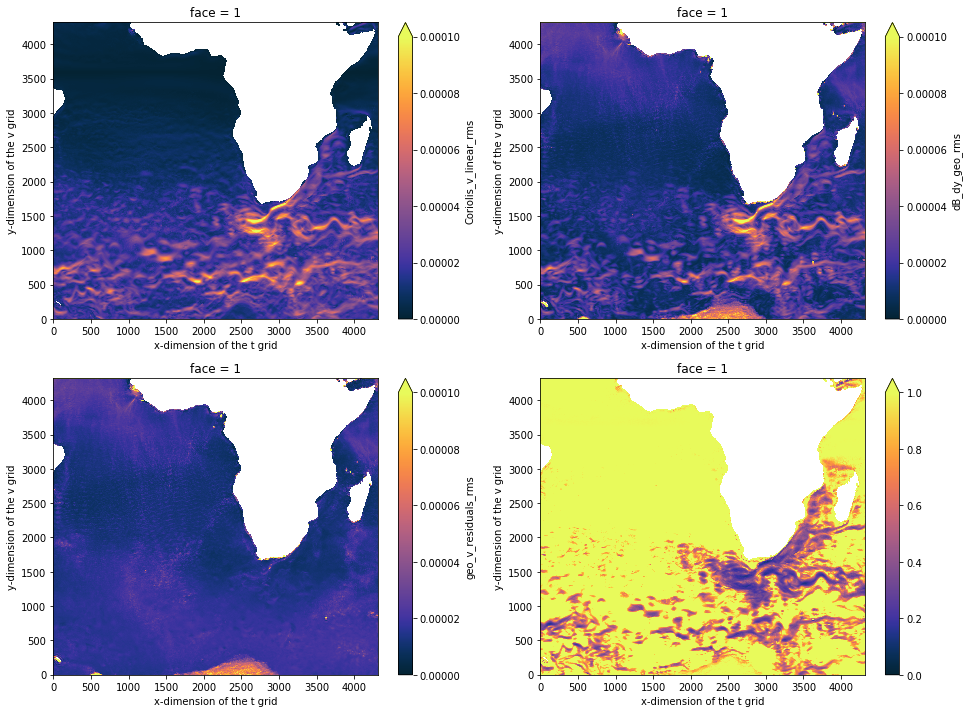

In [17]:
face_plot = 1

fig = plt.figure(figsize = (16,12))

plt.subplot(221)
ds['Coriolis_v_linear_rms'].isel(face= face_plot).plot(vmin=0., vmax=1*10e-5, cmap = cm.thermal)

plt.subplot(222)
ds['dB_dy_geo_rms'].isel(face= face_plot).plot(vmin=0., vmax=1*10e-5, cmap = cm.thermal)

plt.subplot(223)
ds['geo_v_residuals_rms'].isel(face= face_plot).plot(vmin=0., vmax=1*10e-5, cmap = cm.thermal)

plt.subplot(224)
geo_v_percentage_rms.isel(face= face_plot).plot(vmin=0., vmax=1, cmap = cm.thermal)

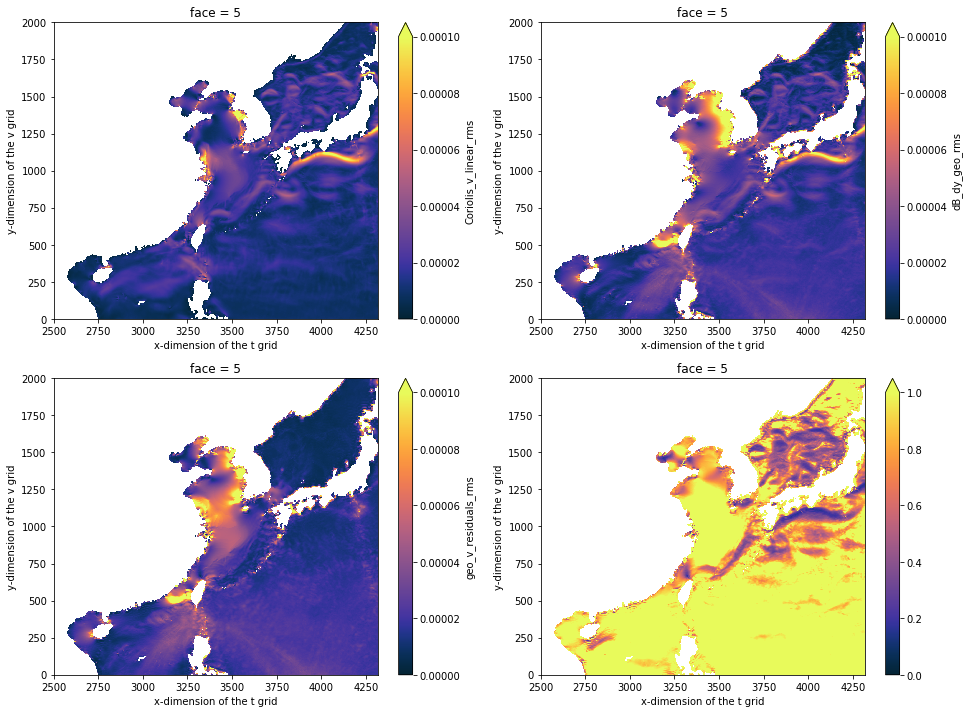

In [20]:
face_plot = 5

fig = plt.figure(figsize = (16,12))

plt.subplot(221)
ds['Coriolis_v_linear_rms'].isel(face= face_plot, i=slice(2500,4320), j_g=slice(0,2000)).plot(vmin=0., vmax=1*10e-5, cmap = cm.thermal)

plt.subplot(222)
ds['dB_dy_geo_rms'].isel(face= face_plot, i=slice(2500,4320), j_g=slice(0,2000)).plot(vmin=0., vmax=1*10e-5, cmap = cm.thermal)

plt.subplot(223)
ds['geo_v_residuals_rms'].isel(face= face_plot, i=slice(2500,4320), j_g=slice(0,2000)).plot(vmin=0., vmax=1*10e-5, cmap = cm.thermal)

plt.subplot(224)
geo_v_percentage_rms.isel(face= face_plot, i=slice(2500,4320), j_g=slice(0,2000)).plot(vmin=0., vmax=1, cmap = cm.thermal)

In [18]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

## 3.1 Zonal component

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.12:41717 remote=tcp://10.148.1.12:36936>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.12:42690 remote=tcp://10.148.1.12:36936>


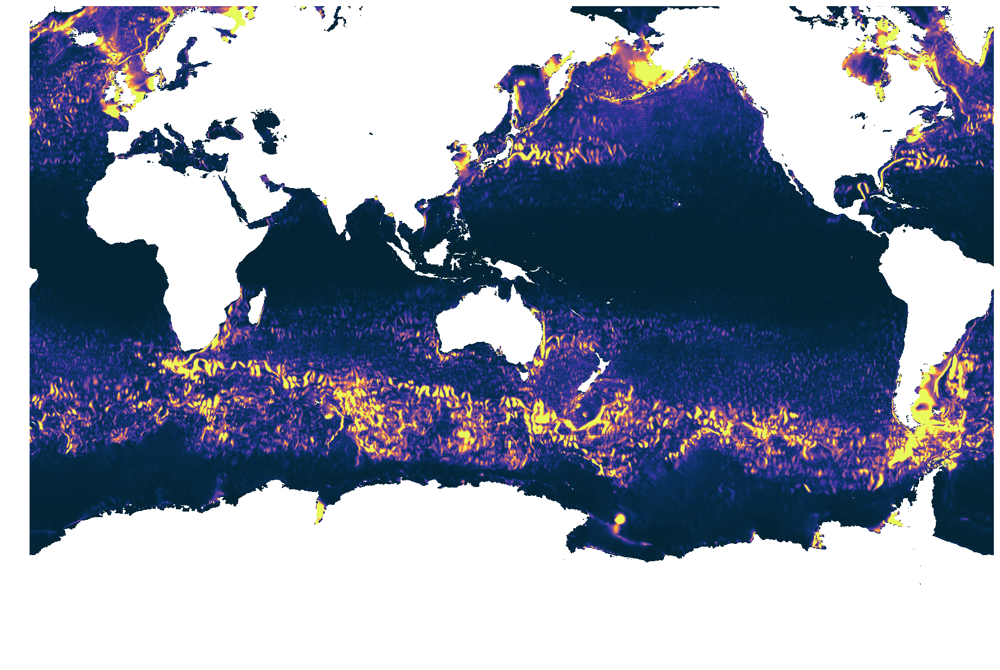

In [13]:
quick_llc_plot(Coriolis_u_linear_rms, vmin=0., vmax=2.*10e-10, add_colorbar=False, axis_off=True, cmap = cm.thermal)

distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.12:40622 remote=tcp://10.148.1.12:36936>
distributed.comm.tcp - WARNING - Closing dangling stream in <TCP local=tcp://10.148.1.12:41108 remote=tcp://10.148.1.12:36936>


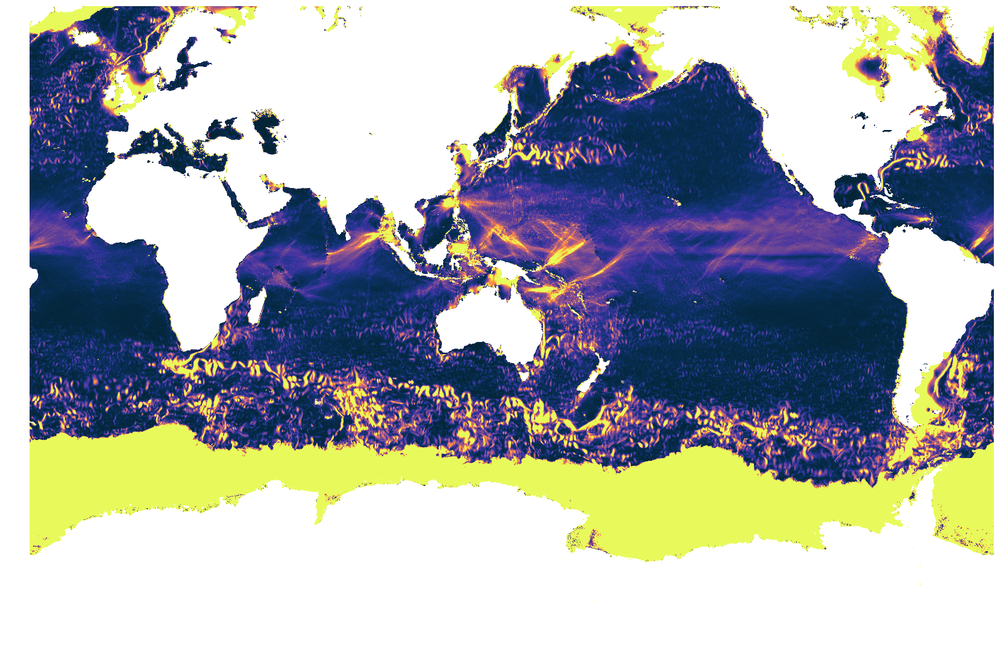

In [14]:
quick_llc_plot(dB_dx_geo_rms, vmin=0., vmax=2.*10e-10, add_colorbar=False, axis_off=True, cmap = cm.thermal)

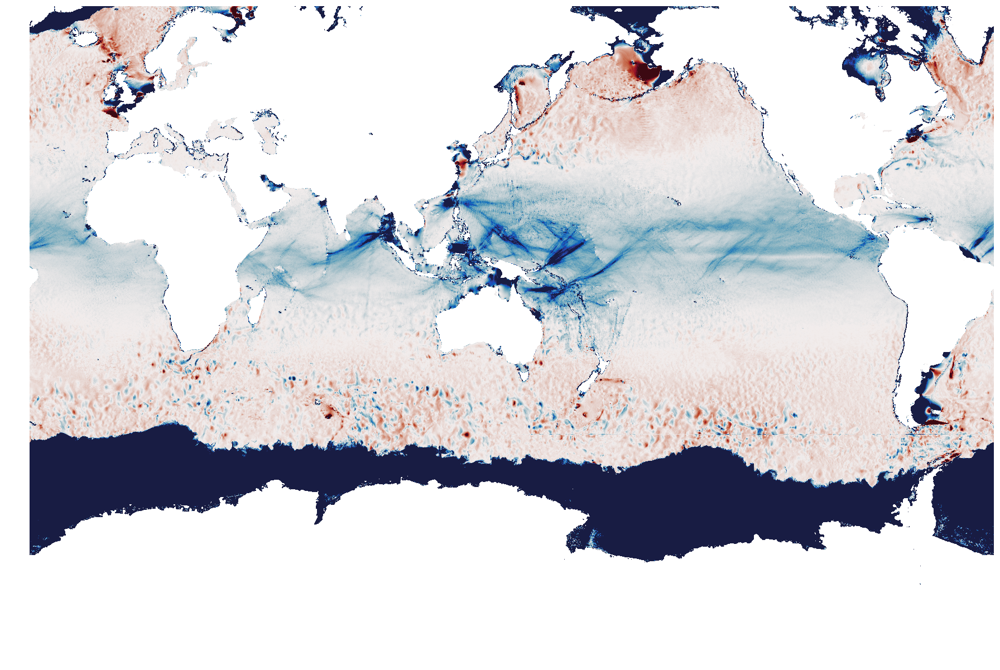

In [25]:
quick_llc_plot(geo_u_residuals_rms, vmin=-2.*10e-10, vmax=2.*10e-10, add_colorbar=False, axis_off=True, cmap = cm.balance)

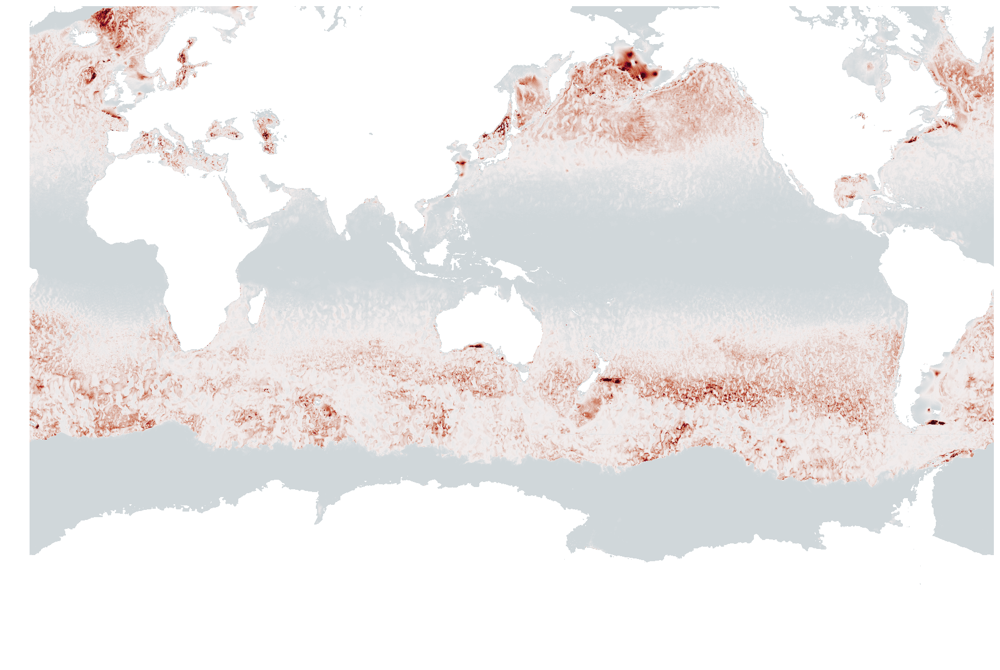

In [29]:
quick_llc_plot(geo_u_percentage_rms, vmin=-10., vmax=10., add_colorbar=False, axis_off=True, cmap = cm.balance)

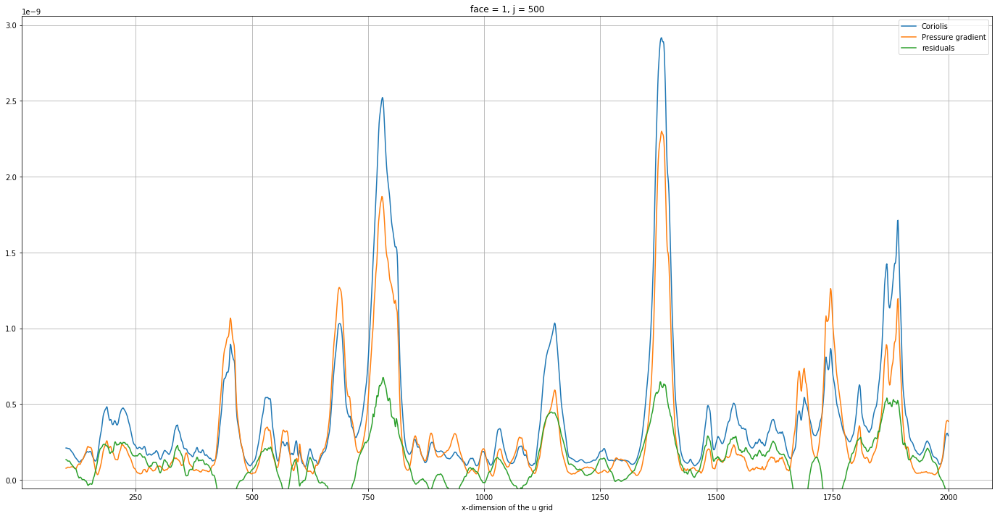

In [28]:
face_plot = 1

fig, ax = plt.subplots(figsize=(24,12))
labels = ['Coriolis','Pressure gradient','residuals']

Coriolis_u_linear_rms.isel(face=face_plot,i_g=slice(100,2000),j=500).load().plot(ax=ax,label=labels[0])
dB_dx_geo_rms.isel(face=face_plot,i_g=slice(100,2000),j=500).load().plot(ax=ax,label=labels[1])
(Coriolis_u_linear_rms - dB_dx_geo_rms).isel(face=face_plot,i_g=slice(100,2000),j=500).load().plot(ax=ax,label=labels[2])

ax.legend(); ax.grid()
#ax.set_xlim([0,480])
#ax.set_ylim([-100,100])

## 3.2 Meridional component

In [25]:
def quick_llc_plot(data, axis_off=False, **kwargs):
    face_to_axis = {0: (2, 0), 1: (1, 0), 2: (0, 0),
                    3: (2, 1), 4: (1, 1), 5: (0, 1),
                    7: (0, 2), 8: (1, 2), 9: (2, 2),
                    10: (0, 3), 11: (1, 3), 12: (2, 3)}
    transpose = [7, 8, 9, 10, 11, 12]
    gridspec_kw = dict(left=0, bottom=0, right=4, top=4, wspace=0, hspace=0)
    fig, axes = plt.subplots(nrows=3, ncols=4, gridspec_kw=gridspec_kw)
    for face, (j, i) in face_to_axis.items():
        data_ax = data.isel(face=face)
        ax = axes[j,i]
        yincrease = True
        if face in transpose:
            data_ax = data_ax.transpose()
            yincrease = False
        data_ax.plot(ax=ax, yincrease=yincrease, **kwargs)
        if axis_off:
            ax.axis('off')
        ax.set_title('')

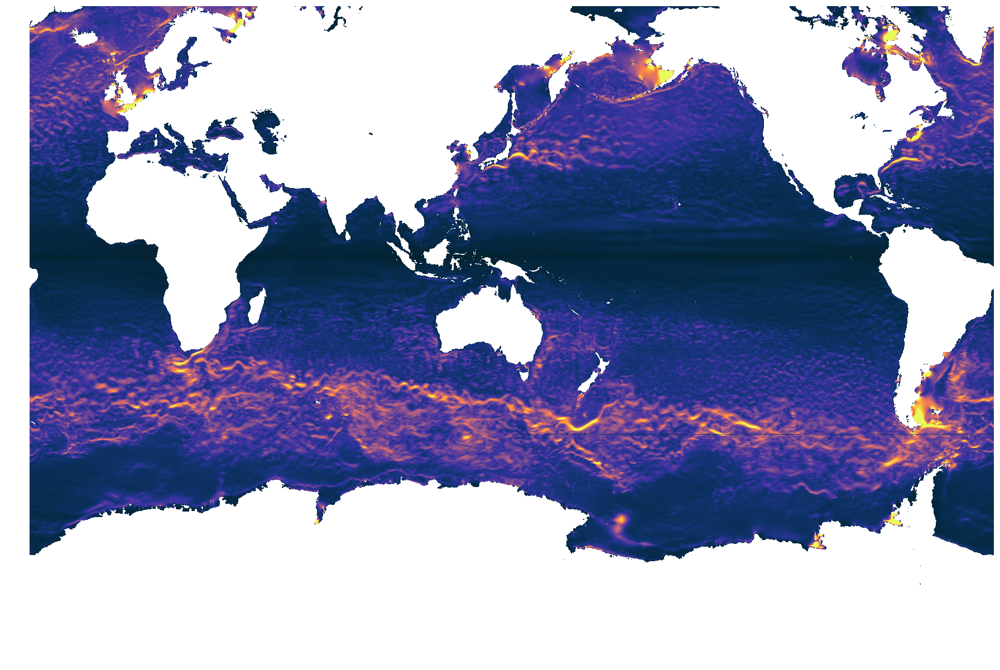

In [26]:
quick_llc_plot(ds['Coriolis_v_linear_rms'], vmin=0., vmax=1.*10e-5, add_colorbar=False, axis_off=True, cmap = cm.thermal)

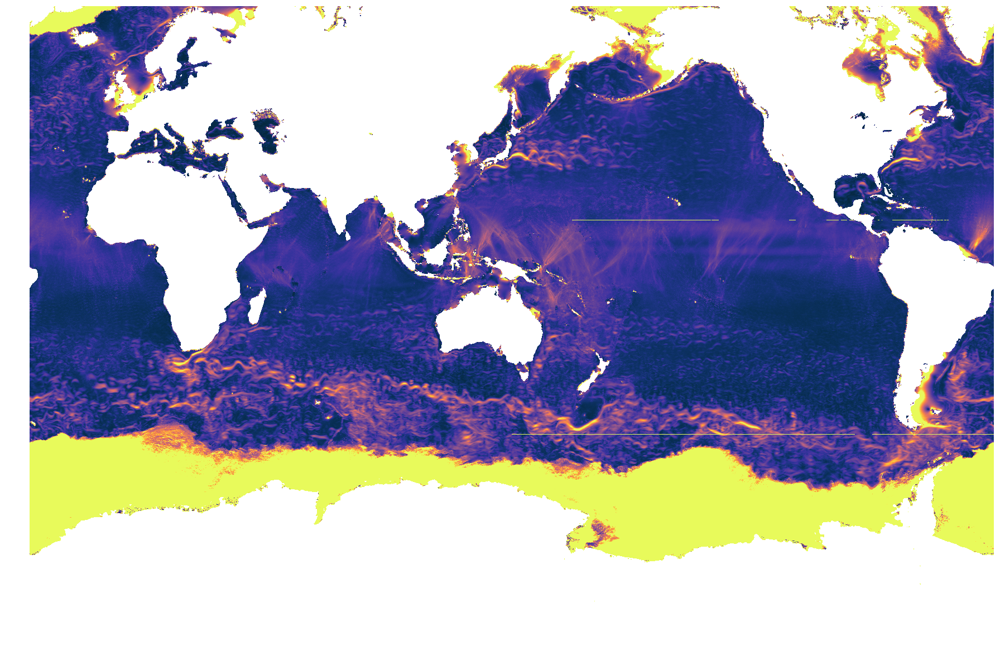

In [27]:
quick_llc_plot(ds['dB_dy_geo_rms'], vmin=0., vmax=1.*10e-5, add_colorbar=False, axis_off=True, cmap = cm.thermal)

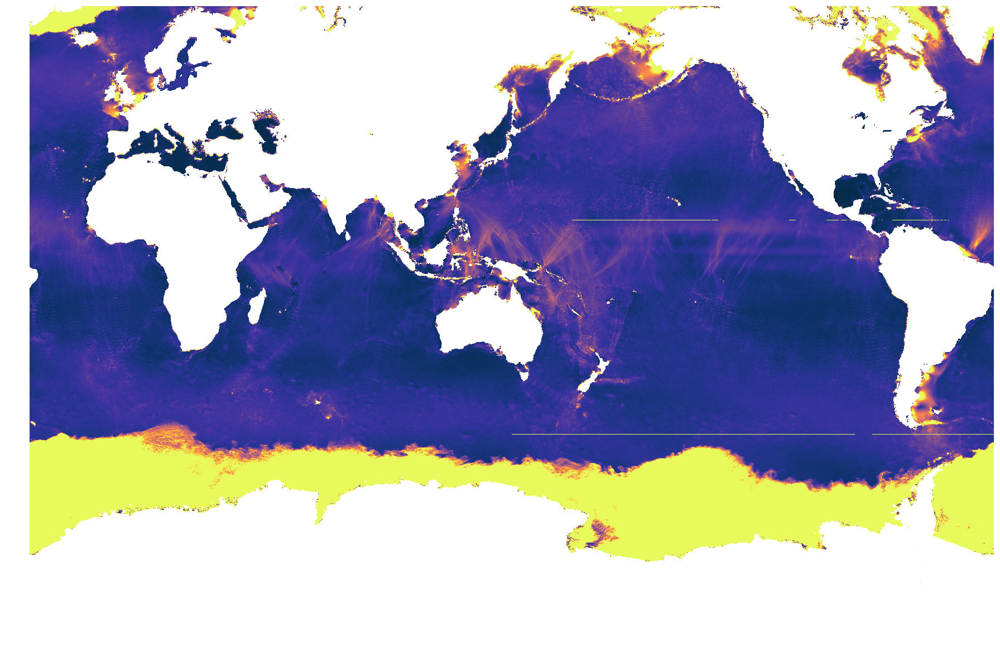

In [19]:
quick_llc_plot(ds['geo_v_residuals_rms'], vmin=0., vmax=1.*10e-5, add_colorbar=False, axis_off=True, cmap = cm.thermal)

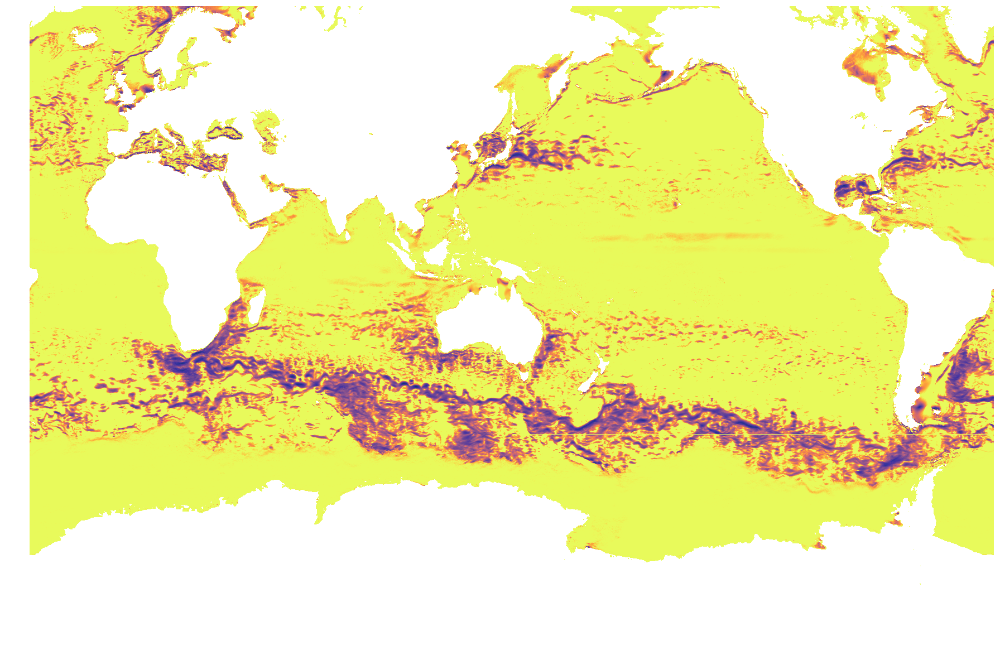

In [21]:
quick_llc_plot(geo_v_percentage_rms, vmin=0, vmax=1., add_colorbar=False, axis_off=True, cmap = cm.thermal)

(0, 8e-05)

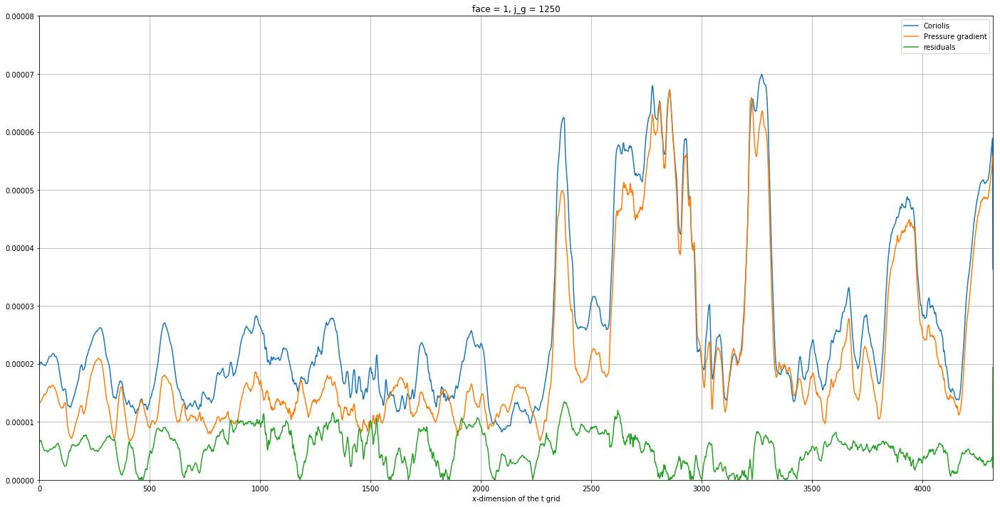

In [18]:
face_plot = 1

fig, ax = plt.subplots(figsize=(24,12))
labels = ['Coriolis','Pressure gradient','residuals']

Coriolis_v_linear_rms.isel(face=face_plot,i=slice(0,4320),j_g=1250).plot(ax=ax,label=labels[0])
dB_dy_geo_rms.isel(face=face_plot,i=slice(0,4320),j_g=1250).plot(ax=ax,label=labels[1])
np.abs(Coriolis_v_linear_rms - dB_dy_geo_rms).isel(face=face_plot,i=slice(0,4320),j_g=1250).plot(ax=ax,label=labels[2])

ax.legend(); ax.grid()
ax.set_xlim([0,4320])
ax.set_ylim([0,0.00008])

(0, 5e-05)

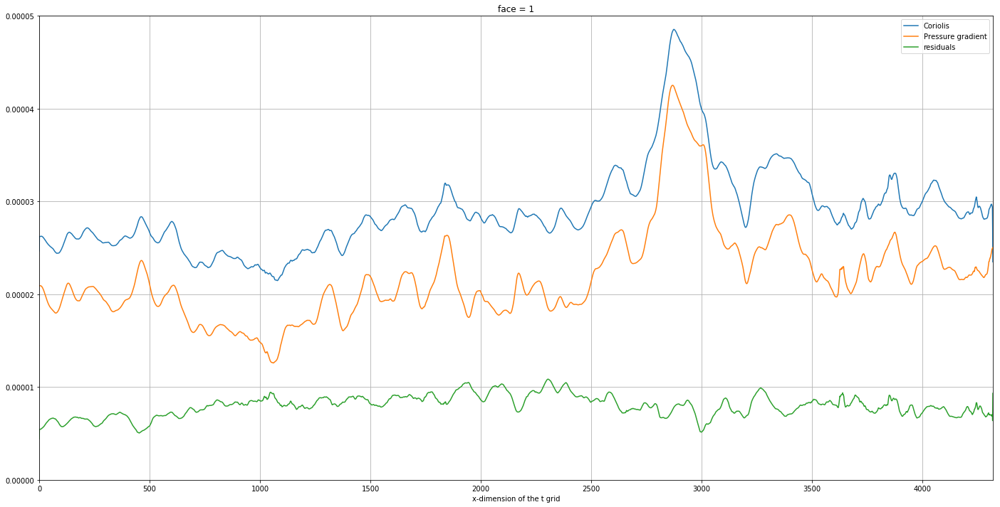

In [20]:
face_plot = 1

fig, ax = plt.subplots(figsize=(24,12))
labels = ['Coriolis','Pressure gradient','residuals']

Coriolis_v_linear_rms.isel(face=face_plot,i=slice(0,4320),j_g=slice(500,1250)).mean(dim='j_g').plot(ax=ax,label=labels[0])
dB_dy_geo_rms.isel(face=face_plot,i=slice(0,4320),j_g=slice(500,1250)).mean(dim='j_g').plot(ax=ax,label=labels[1])
np.abs(Coriolis_v_linear_rms - dB_dy_geo_rms).isel(face=face_plot,i=slice(0,4320),j_g=slice(500,1250)).mean(dim='j_g').plot(ax=ax,label=labels[2])

ax.legend(); ax.grid()
ax.set_xlim([0,4320])
ax.set_ylim([0,0.00005])

## y: (0-200) ---> sea ice;  (2500-4320) --> near the equator

(0, 5e-05)

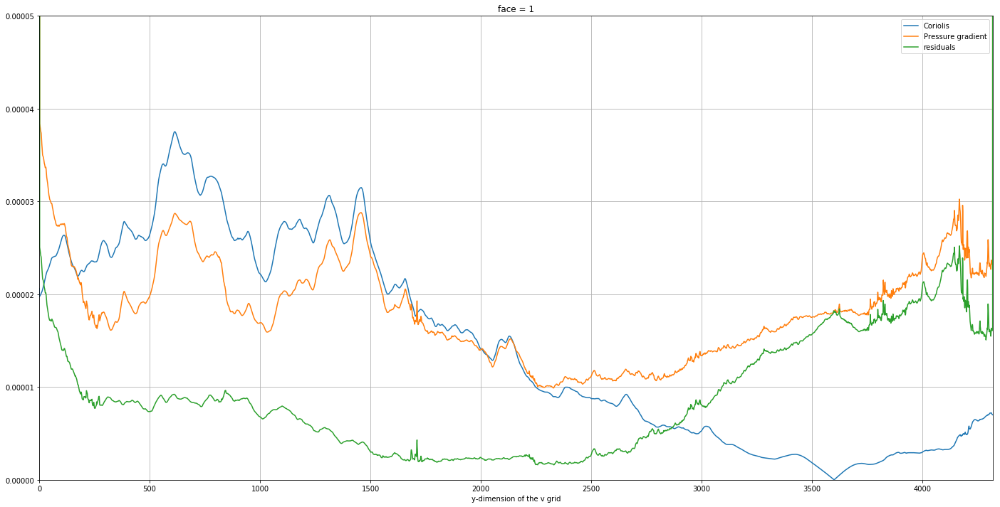

In [23]:
face_plot = 1

fig, ax = plt.subplots(figsize=(24,12))
labels = ['Coriolis','Pressure gradient','residuals']

Coriolis_v_linear_rms.isel(face=face_plot,i=slice(0,4320),j_g=slice(0,4320)).mean(dim='i').plot(ax=ax,label=labels[0])
dB_dy_geo_rms.isel(face=face_plot,i=slice(0,4320),j_g=slice(0,4320)).mean(dim='i').plot(ax=ax,label=labels[1])
np.abs(Coriolis_v_linear_rms - dB_dy_geo_rms).isel(face=face_plot,i=slice(0,4320),j_g=slice(0,4320)).mean(dim='i').plot(ax=ax,label=labels[2])

ax.legend(); ax.grid()
ax.set_xlim([0,4320])
ax.set_ylim([0,0.00005])

In [23]:
cluster.scheduler.close()

<Future finished result=None>